In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import nltk
nltk.download("all")

In [3]:
import seaborn as sns
from string import punctuation
import unidecode
from sklearn.feature_extraction.text import TfidfVectorizer

In [4]:
#Lendo o dataset
data = pd.read_csv("/Users/gustavobrandao/Downloads/IMDB Dataset.csv")
data.sentiment.replace(["positive","negative"],[1,0],inplace=True)
data.tail()

,review,sentiment
49995,I thought this movie did a down right good job...,1
49996,"Bad plot, bad dialogue, bad acting, idiotic di...",0
49997,I am a Catholic taught in parochial elementary...,0
49998,I'm going to have to disagree with the previou...,0
49999,No one expects the Star Trek movies to be high...,0


In [5]:
#Verificando se as classes estão balanceadas
print("Contagem das classes:")
print(data.sentiment.value_counts())

#Vetorizando os textos a serem analizados 
vetorizador = CountVectorizer(lowercase=False,max_features=50)
bag_of_words = vetorizador.fit_transform(data.review)
matriz_esparsa = pd.DataFrame.sparse.from_spmatrix(bag_of_words,columns=vetorizador.get_feature_names_out())

#Separando os dados em treino e teste
x_train,x_test,y_train,y_test = train_test_split(matriz_esparsa,data.sentiment,random_state=42)
matriz_esparsa.head()

Contagem das classes:
sentiment
1    25000
0    25000
Name: count, dtype: int64


,It,The,This,about,all,an,and,are,as,at,...,the,they,this,to,up,very,was,who,with,you
0,2,2,1,1,1,1,6,2,4,0,...,14,0,2,6,0,0,3,2,5,3
1,1,3,0,1,2,0,7,2,0,0,...,13,0,0,2,0,2,0,0,3,0
2,0,1,2,0,0,0,4,1,0,1,...,7,1,3,4,0,0,4,0,2,0
3,0,0,1,0,3,0,3,2,0,0,...,6,0,0,3,0,0,0,0,3,2
4,0,2,2,2,2,0,5,1,1,0,...,18,1,0,7,0,0,0,0,1,0


In [6]:
#Criando modelo para classificação das frases em positivas e negativas
model_lg = LogisticRegression()
model_lg.fit(x_train,y_train)
y_pred = model_lg.predict(x_test)
acuracia = accuracy_score(y_test,y_pred)
print(f"A acuracia do {model_lg} foi de {acuracia*100}%")

A acuracia do LogisticRegression() foi de 65.2%


In [7]:
def classifica_texto(dataframe,coluna_texto,coluna_classificacao):
    vetorizador = CountVectorizer(lowercase=False,max_features=50)
    bag_of_words = vetorizador.fit_transform(dataframe[coluna_texto])
    x_train,x_test,y_train,y_test = train_test_split(bag_of_words,dataframe[coluna_classificacao],random_state=42)
    model = LogisticRegression(random_state=42)
    model.fit(x_train,y_train)
    y_pred = model.predict(x_test)
    acuracia = accuracy_score(y_test,y_pred)
    return acuracia
classifica_texto(data,"review","sentiment")


0.652

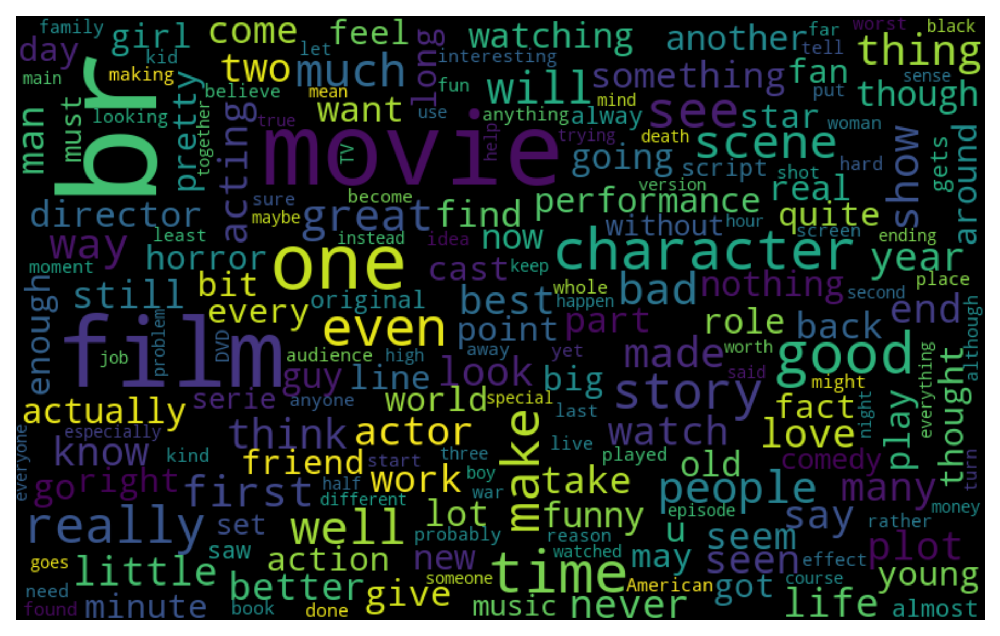

In [8]:
#Analizando a imagem com as palavras mais recorrentes no texto
%matplotlib inline
frase_completa = " ".join([texto for texto in data.review])
nuvem_palavras = WordCloud(collocations=False,width=800,height=500,max_font_size=110).generate(frase_completa)
fig,ax = plt.subplots(figsize=(8,6),dpi=300)
plt.imshow(nuvem_palavras,interpolation="bilinear")
plt.axis("off")
plt.show()

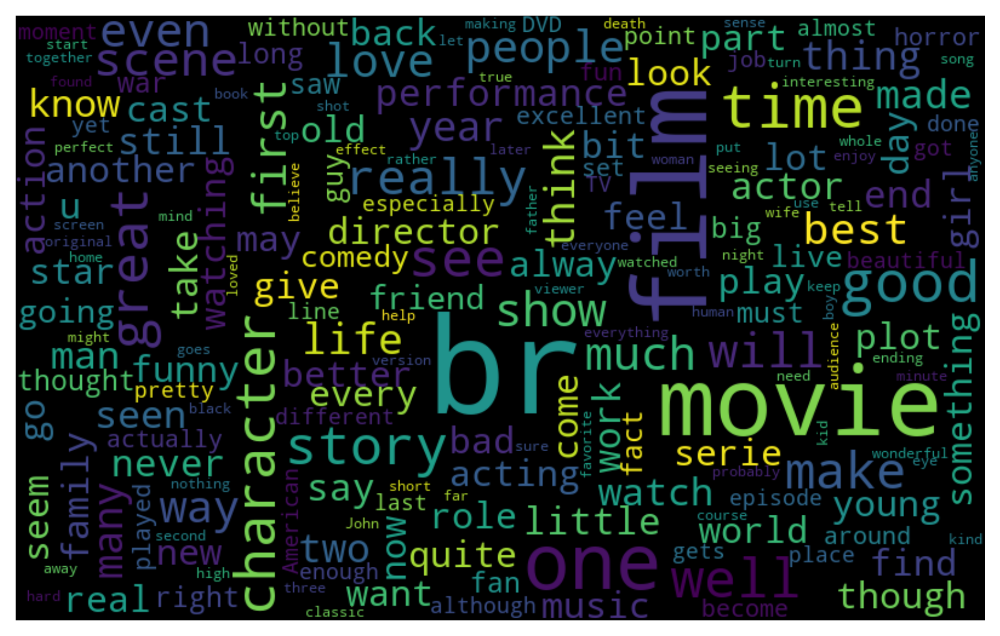

In [9]:
#Analizando a imagem com palavras que indicam sentimentos positivos
%matplotlib inline
frase_completa = " ".join([texto for texto in data.review[data.sentiment == 1]])
nuvem_palavras = WordCloud(collocations=False,width=800,height=500,max_font_size=110).generate(frase_completa)
fig,ax = plt.subplots(figsize=(8,6),dpi=300)
plt.imshow(nuvem_palavras,interpolation="bilinear")
plt.axis("off")
plt.show()

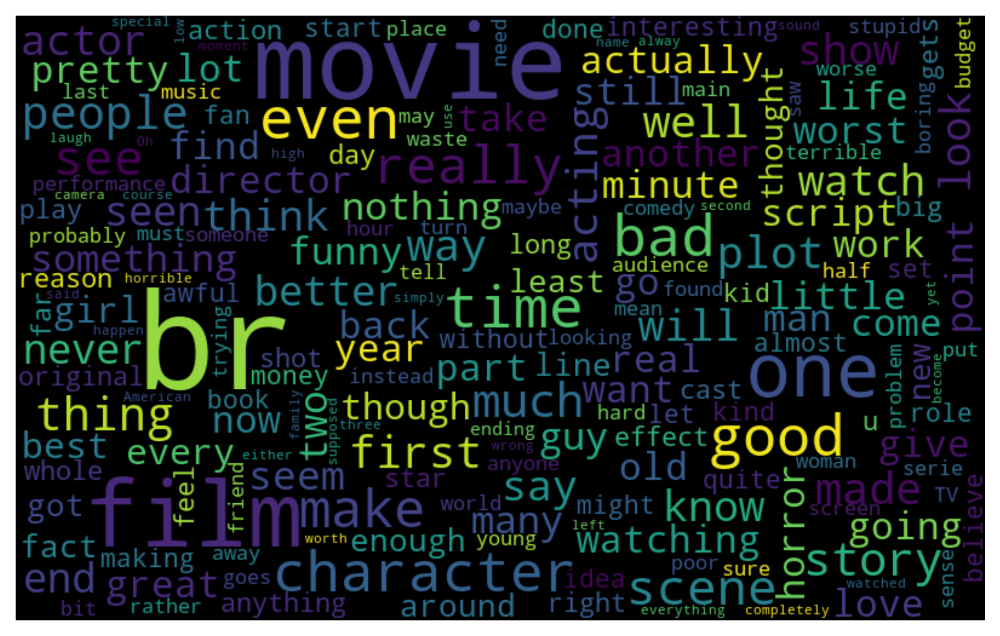

In [10]:
#Analizando a imagem com palavras que indicam sentimento negativo
%matplotlib inline
frase_completa = " ".join([texto for texto in data.review[data.sentiment == 0]])
nuvem_palavras = WordCloud(collocations=False,width=800,height=500,max_font_size=110).generate(frase_completa)
fig,ax = plt.subplots(figsize=(8,6),dpi=300)
plt.imshow(nuvem_palavras,interpolation="bilinear")
plt.axis("off")
plt.show()

In [11]:
texto_completo = " ".join([texto for texto in data.review])
frase = "The world will suffer by the hands of humans"
tokenizador = nltk.tokenize.WhitespaceTokenizer()
tokenizador_frase = tokenizador.tokenize(texto_completo)
contagem_palavras = nltk.FreqDist(tokenizador_frase)
contagem_palavras

FreqDist({'the': 568735, 'a': 306960, 'and': 301919, 'of': 283625, 'to': 261850, 'is': 203056, 'in': 169981, 'I': 132498, 'that': 126818, 'this': 113726, ...})

In [12]:
frequencia_dataframe = pd.DataFrame({"Palavra":list(contagem_palavras.keys()),"Frequencia":list(contagem_palavras.values())})
frequencia_dataframe.sort_values(by="Frequencia",inplace=True,ascending=False)
frequencia_dataframe.head(10)

,Palavra,Frequencia
2,the,568735
52,a,306960
38,and,301919
1,of,283625
64,to,261850
22,is,203056
44,in,169981
151,I,132498
7,that,126818
21,this,113726


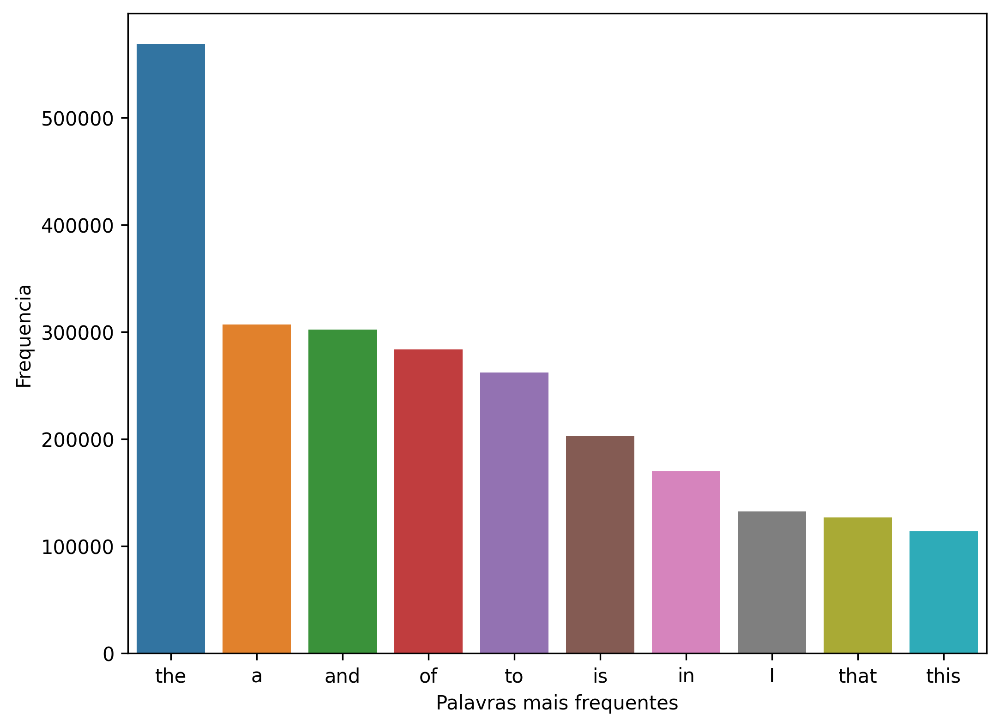

In [13]:
#Criando uma função para tokenizar e plotar as palavras mais frequentes no corpus de texto.
def visualizando_dados(dataframe,coluna_texto):
    texto_completo = " ".join([texto for texto in dataframe[coluna_texto]])
    tokenizer = nltk.tokenize.WhitespaceTokenizer()
    palavras_tokenizadas = tokenizer.tokenize(texto_completo)
    contagem_palavras = nltk.FreqDist(palavras_tokenizadas)
    dataframe_v2 = pd.DataFrame({"Palavra":list(contagem_palavras.keys()),"Frequencia":list(contagem_palavras.values())})
    fig,ax = plt.subplots(figsize=(8,6),dpi=300)
    dataframe_v2.sort_values(by="Frequencia",inplace=True,ascending=False)
    sns.barplot(x=dataframe_v2.Palavra.head(10),y=dataframe_v2.Frequencia.head(10))
    plt.xlabel("Palavras mais frequentes")
visualizando_dados(data,"review")

In [14]:
#Criando uma nova feature em que as palavras menos relevantes, conhecidas como stop-words, são retiradas
stop_words = nltk.corpus.stopwords.words("english")
lista_adicional = ["br","<",">","<br>","/><br","<br"]
for k in lista_adicional:
    stop_words.append(k)
pos_tratamento = list()
for i in data.review:
    temp = []
    frase = tokenizador.tokenize(i)
    for j in frase:
        if j not in stop_words:
            temp.append(j)
    pos_tratamento.append(" ".join(temp))
data["pos_tratamento"] = pos_tratamento
data.head()

,review,sentiment,pos_tratamento
0,One of the other reviewers has mentioned that ...,1,One reviewers mentioned watching 1 Oz episode ...
1,A wonderful little production. <br /><br />The...,1,A wonderful little production. />The filming t...
2,I thought this was a wonderful way to spend ti...,1,I thought wonderful way spend time hot summer ...
3,Basically there's a family where a little boy ...,0,Basically there's family little boy (Jake) thi...
4,"Petter Mattei's ""Love in the Time of Money"" is...",1,"Petter Mattei's ""Love Time Money"" visually stu..."


In [15]:
classifica_texto(data,"pos_tratamento","sentiment")

0.70832

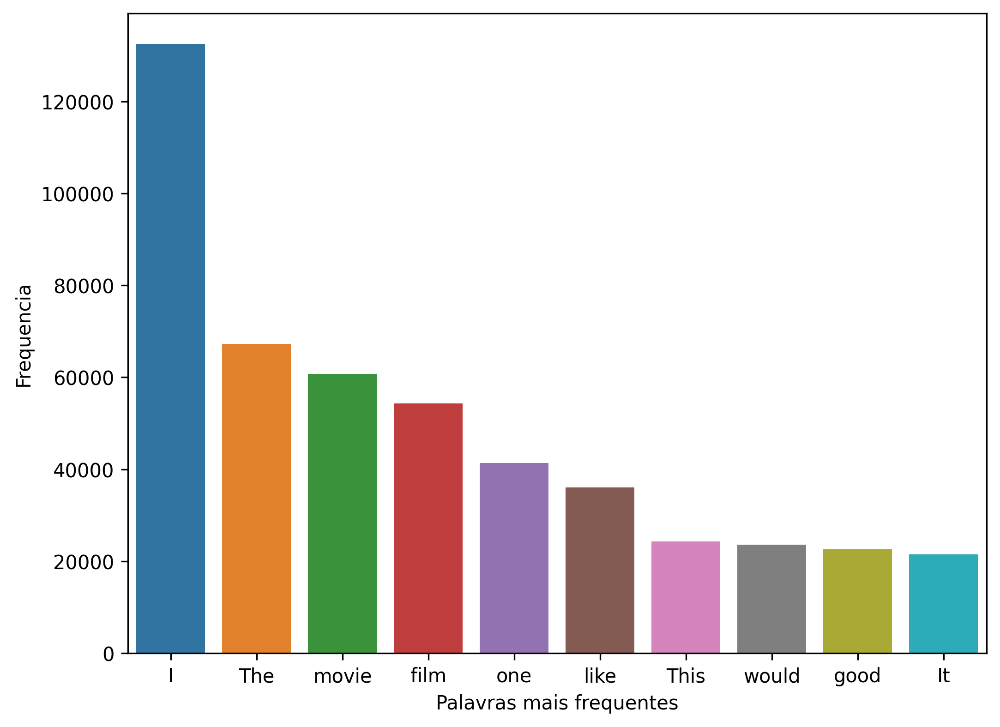

In [16]:
visualizando_dados(data,"pos_tratamento")

In [17]:
#Tokenizando a frase e a pontuação (reduz diferenças de palavras devido a uma pontuação)
tokenizer_punct = nltk.tokenize.WordPunctTokenizer()
stop_words = nltk.corpus.stopwords.words("english")
lista_adicional = ["br","<",">","<br>","/><br","<br","br>","/>",".<"]
pontuacao = list()
for k in punctuation:
    pontuacao.append(k)
stop_words = stop_words + lista_adicional + pontuacao
pos_tratamento_v2 = list()
for i in data.pos_tratamento:
    temp = []
    frase = tokenizer_punct.tokenize(i)
    for j in frase:
        if j not in stop_words:
            temp.append(j)
    pos_tratamento_v2.append(" ".join(temp))
data["pos_tratamento_v2"] = pos_tratamento_v2
data.head()

,review,sentiment,pos_tratamento,pos_tratamento_v2
0,One of the other reviewers has mentioned that ...,1,One reviewers mentioned watching 1 Oz episode ...,One reviewers mentioned watching 1 Oz episode ...
1,A wonderful little production. <br /><br />The...,1,A wonderful little production. />The filming t...,A wonderful little production The filming tech...
2,I thought this was a wonderful way to spend ti...,1,I thought wonderful way spend time hot summer ...,I thought wonderful way spend time hot summer ...
3,Basically there's a family where a little boy ...,0,Basically there's family little boy (Jake) thi...,Basically family little boy Jake thinks zombie...
4,"Petter Mattei's ""Love in the Time of Money"" is...",1,"Petter Mattei's ""Love Time Money"" visually stu...",Petter Mattei Love Time Money visually stunnin...


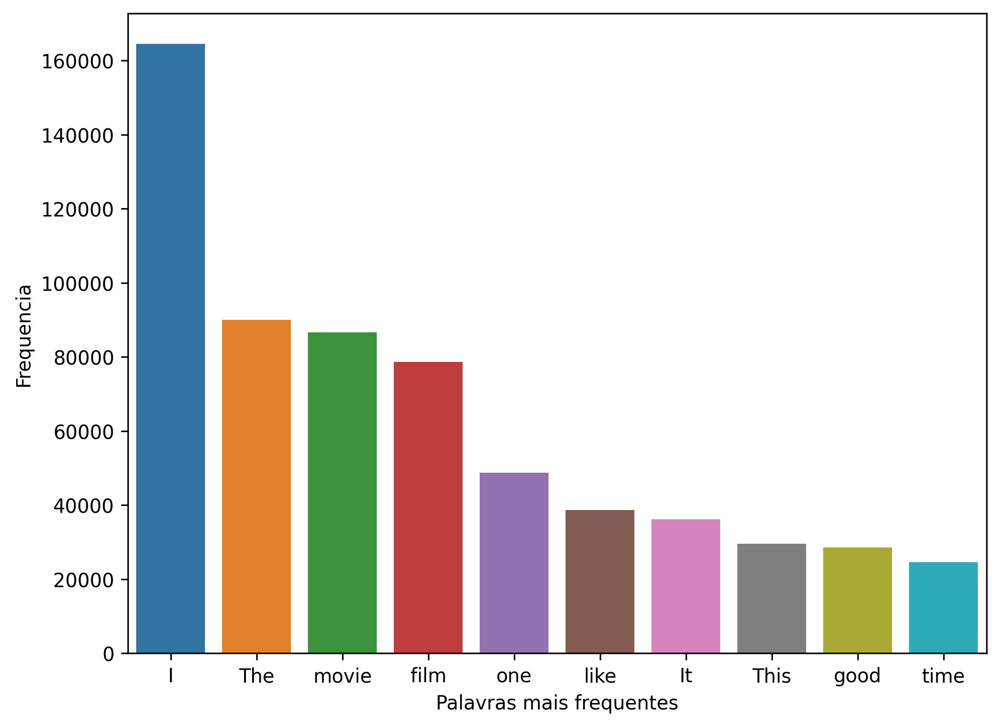

In [18]:
visualizando_dados(data,"pos_tratamento_v2")

In [19]:
classifica_texto(data,"pos_tratamento_v2","sentiment")

0.70832

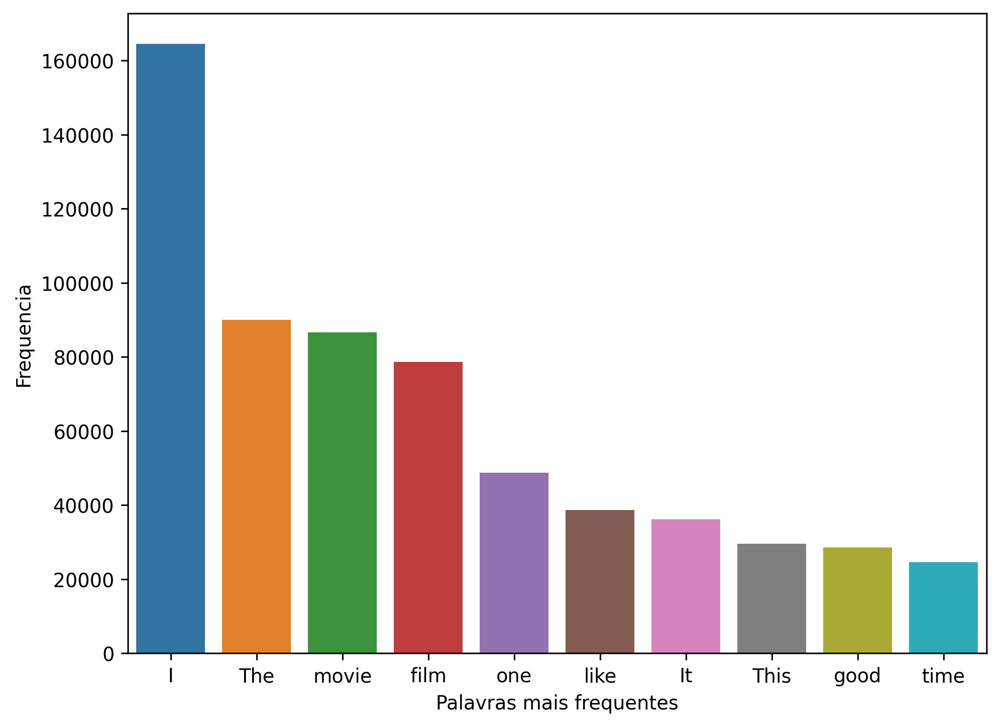

In [20]:
stop_words_acento = [unidecode.unidecode(texto) for texto in stop_words]
def sem_acento(palavra):
    palavra_1 = unidecode.unidecode(palavra)
    return palavra_1
data["pos_tratamento_v3"] = data["pos_tratamento_v2"].apply(sem_acento)
frase_final = []
for j in data["pos_tratamento_v3"]:
    temp = []
    tokenizer = nltk.tokenize.WordPunctTokenizer()
    row_tokenizada = tokenizer.tokenize(j)
    for m in row_tokenizada:
        if m not in stop_words_acento:
            temp.append(m)
    frase_final.append(" ".join(temp))
data["pos_tratamento_v4"] = frase_final
visualizando_dados(data,"pos_tratamento_v4")

In [21]:
data.head()

,review,sentiment,pos_tratamento,pos_tratamento_v2,pos_tratamento_v3,pos_tratamento_v4
0,One of the other reviewers has mentioned that ...,1,One reviewers mentioned watching 1 Oz episode ...,One reviewers mentioned watching 1 Oz episode ...,One reviewers mentioned watching 1 Oz episode ...,One reviewers mentioned watching 1 Oz episode ...
1,A wonderful little production. <br /><br />The...,1,A wonderful little production. />The filming t...,A wonderful little production The filming tech...,A wonderful little production The filming tech...,A wonderful little production The filming tech...
2,I thought this was a wonderful way to spend ti...,1,I thought wonderful way spend time hot summer ...,I thought wonderful way spend time hot summer ...,I thought wonderful way spend time hot summer ...,I thought wonderful way spend time hot summer ...
3,Basically there's a family where a little boy ...,0,Basically there's family little boy (Jake) thi...,Basically family little boy Jake thinks zombie...,Basically family little boy Jake thinks zombie...,Basically family little boy Jake thinks zombie...
4,"Petter Mattei's ""Love in the Time of Money"" is...",1,"Petter Mattei's ""Love Time Money"" visually stu...",Petter Mattei Love Time Money visually stunnin...,Petter Mattei Love Time Money visually stunnin...,Petter Mattei Love Time Money visually stunnin...


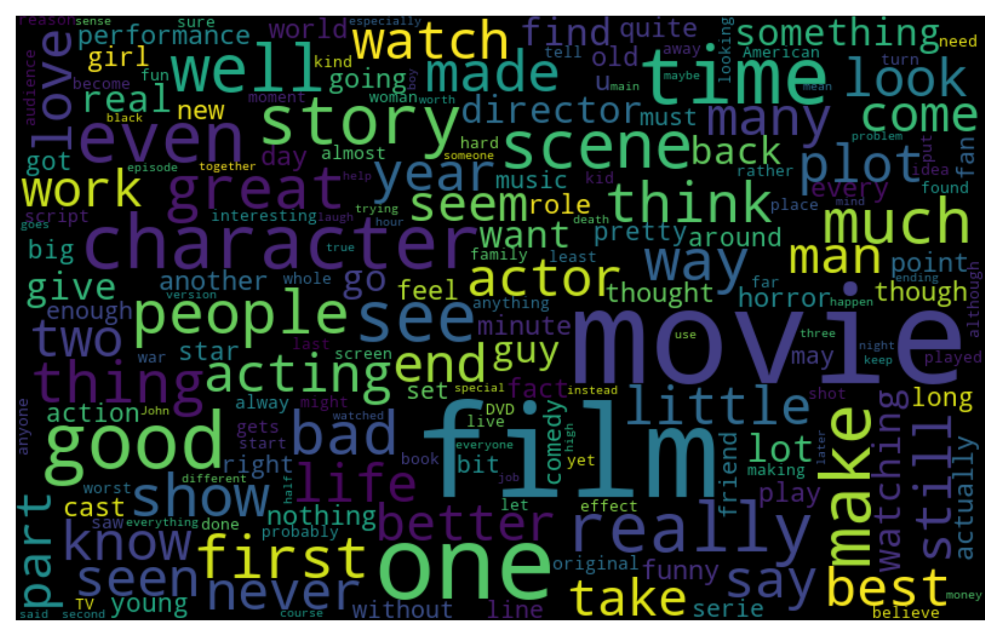

In [22]:
#Criando uma função para plotar os dados da nuvem de palavras - Preferência = True(Positiva) - False(Negativa) - None(Todo o corpus do texto)
def nuvem_dados(dataframe,coluna_texto,coluna_sentimento,preferencia=None):
    %matplotlib inline
    if preferencia == True:
        frase_completa = " ".join([texto for texto in dataframe[coluna_texto][dataframe[coluna_sentimento] == 1]])
        nuvem_de_palavras_pos = WordCloud(collocations=False,width=800,height=500,max_font_size=110).generate(frase_completa)
    elif preferencia == False:
        frase_completa = " ".join([texto for texto in dataframe[coluna_texto][dataframe[coluna_sentimento] == 0]])
        nuvem_de_palavras_pos = WordCloud(collocations=False,width=800,height=500,max_font_size=110).generate(frase_completa)
    else:
        frase_completa = " ".join([texto for texto in dataframe[coluna_texto]])
        nuvem_de_palavras_pos = WordCloud(collocations=False,width=800,height=500,max_font_size=110).generate(frase_completa)
    fig,ax = plt.subplots(figsize=(8,6),dpi=300)
    plt.imshow(nuvem_de_palavras_pos,interpolation="bilinear")
    plt.axis("off")
    plt.show()
nuvem_dados(data,"pos_tratamento_v4","sentiment",)

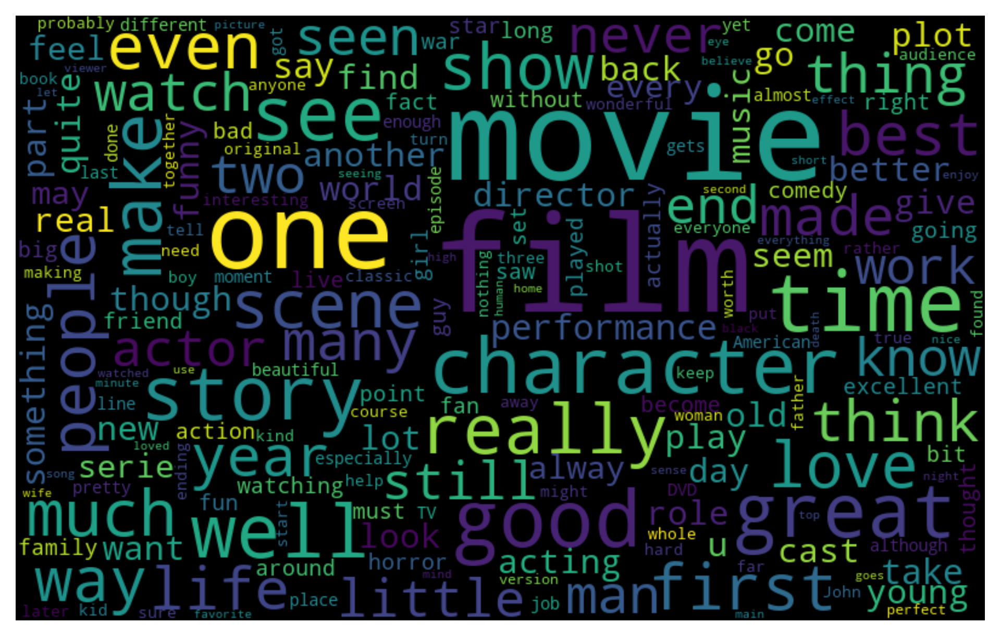

In [23]:
nuvem_dados(data,"pos_tratamento_v4","sentiment",True)

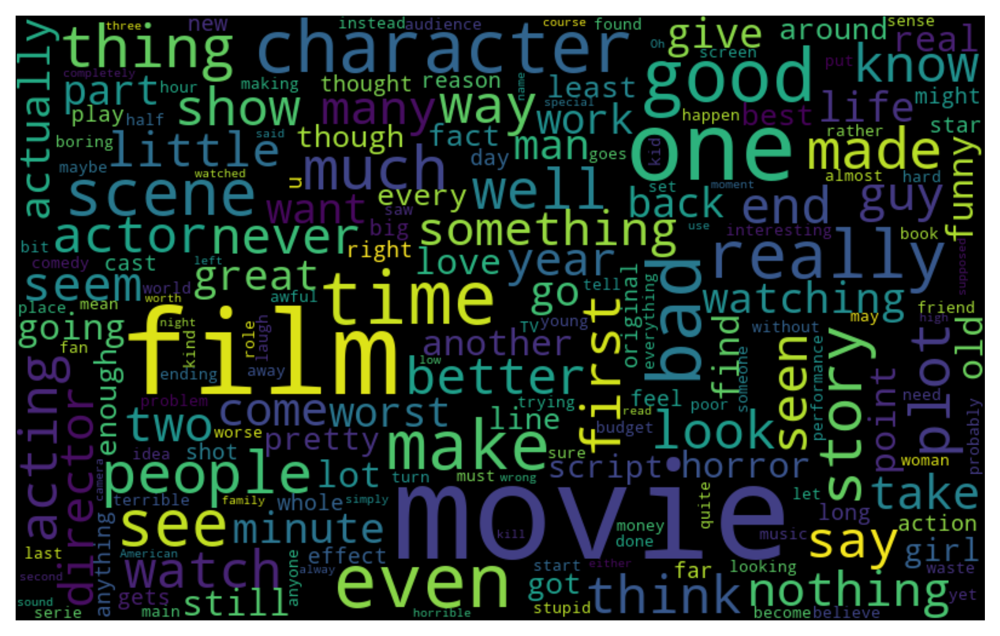

In [24]:
nuvem_dados(data,"pos_tratamento_v4","sentiment",False)

In [25]:
#Transformando todas as letras em minúsculas
frase_final_v2 = []
for j in data["pos_tratamento_v4"]:
    temp = []
    tokenizer = nltk.tokenize.WordPunctTokenizer()
    row_tokenizada = tokenizer.tokenize(j)
    for m in row_tokenizada:
        m = m.lower()
        if m not in stop_words_acento:
            temp.append(m)
    frase_final_v2.append(" ".join(temp))
data["pos_tratamento_v5"] = frase_final_v2


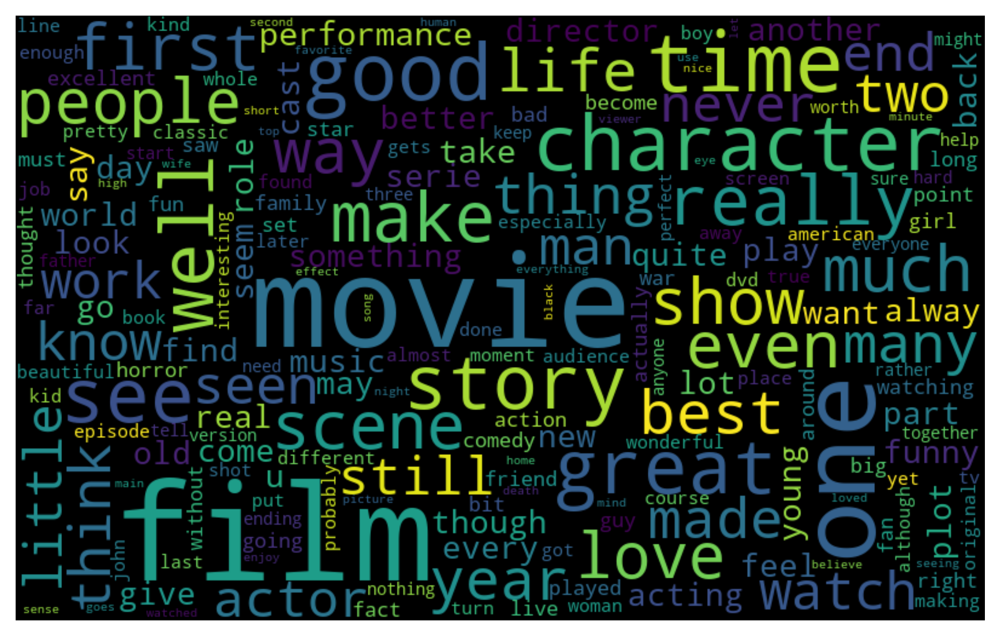

In [26]:
nuvem_dados(data,"pos_tratamento_v5","sentiment",True)

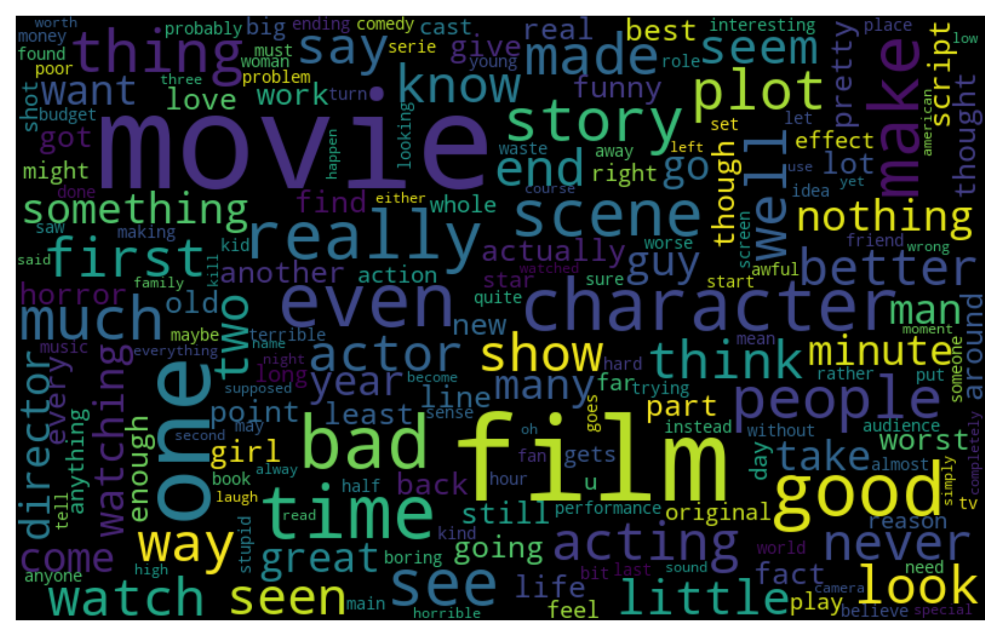

In [27]:
nuvem_dados(data,"pos_tratamento_v5","sentiment",False)

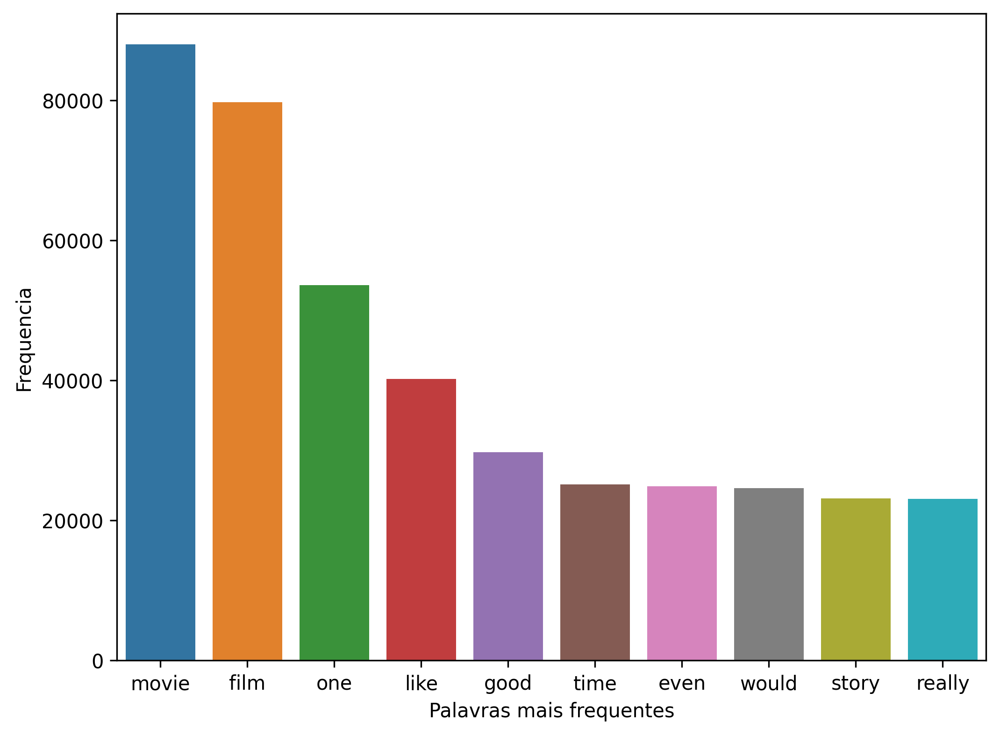

In [28]:
visualizando_dados(data,"pos_tratamento_v5")

In [29]:
print(f"A acurácia do modelo pós tratamento é de {classifica_texto(data,'pos_tratamento_v5','sentiment')*100}%")

A acurácia do modelo pós tratamento é de 70.904%


In [30]:
frase_final_v3 = []
for j in data["pos_tratamento_v5"]:
    temp = []
    tokenizer = nltk.tokenize.WordPunctTokenizer()
    row_tokenizada = tokenizer.tokenize(j)
    for m in row_tokenizada:
        stemmer = nltk.stem.PorterStemmer()
        palavra_stemmizada = stemmer.stem(m)
        temp.append(palavra_stemmizada)
    frase_final_v3.append(" ".join(temp))
data["pos_tratamento_v6"] = frase_final_v3

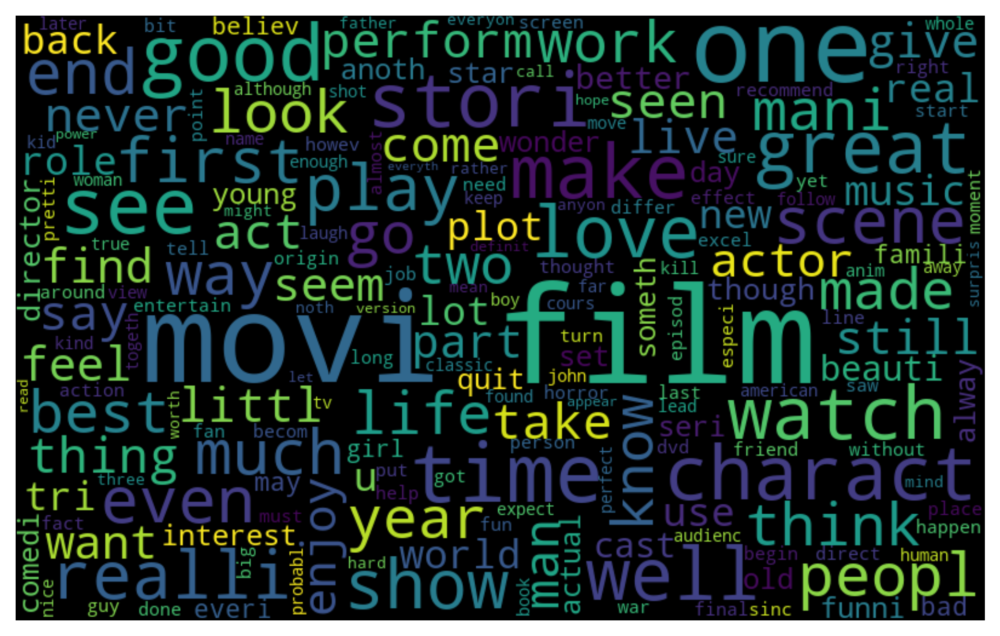

In [31]:
nuvem_dados(data,"pos_tratamento_v6","sentiment",True)

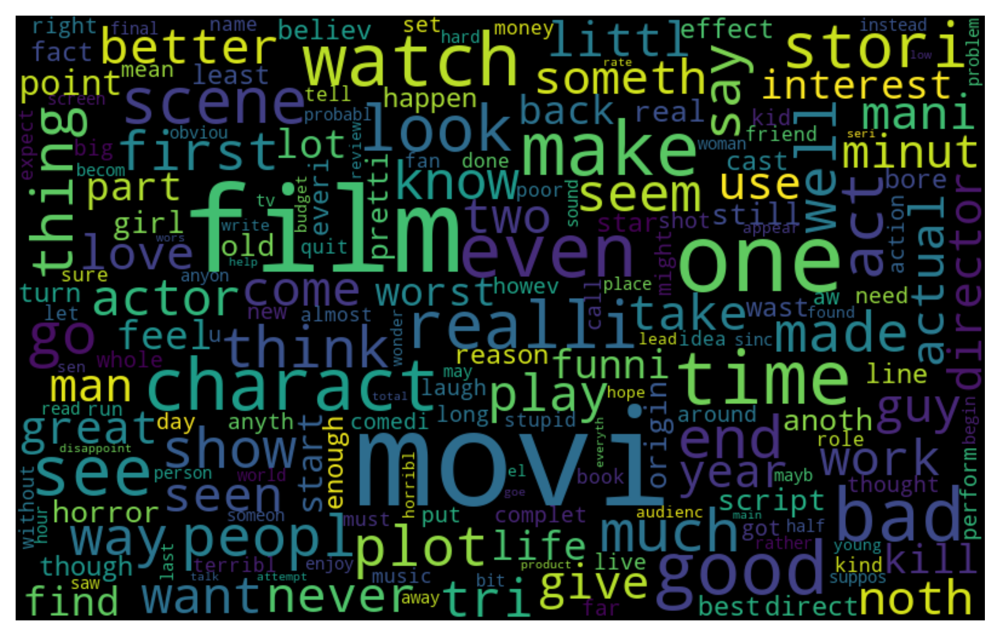

In [32]:
nuvem_dados(data,"pos_tratamento_v6","sentiment",False)

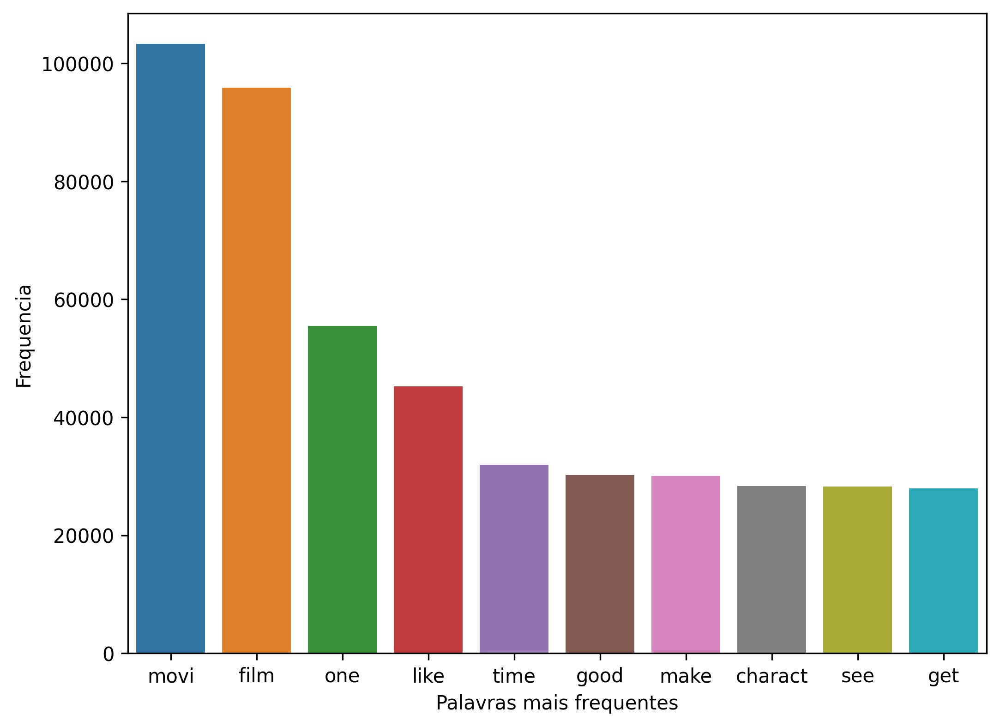

In [33]:
visualizando_dados(data,"pos_tratamento_v6")

In [33]:
print(f"A acurácia do modelo pós stemmização é de {classifica_texto(data,'pos_tratamento_v6','sentiment')*100}%")

A acurácia do modelo pós stemmização é de 71.024%


In [34]:
#Utilizando uma vetorização das palavras de maneira ponderada em relação a frequência dela no texto
tfidf = TfidfVectorizer(lowercase=False,max_features=50)
dados_tfidf_bruto = tfidf.fit_transform(data.review)
tfidf_dataframe = pd.DataFrame(dados_tfidf_bruto.todense(),columns=tfidf.get_feature_names_out())
x_train,x_test,y_train,y_test = train_test_split(tfidf_dataframe,data.sentiment,random_state=42)
model_lg.fit(x_train,y_train)
y_pred = model_lg.predict(x_test)
acuracia = accuracy_score(y_test,y_pred)
print(f"A acurácia do Tfidf nos dados brutos, ou seja, sem o tratamento é de: {acuracia*100}%")

A acurácia do Tfidf nos dados brutos, ou seja, sem o tratamento é de: 65.392%


In [35]:
tfidf = TfidfVectorizer(lowercase=False,max_features=50)
dados_tfidf_tratados = tfidf.fit_transform(data.pos_tratamento_v6)
tfidf_dataframe = pd.DataFrame(dados_tfidf_tratados.todense(),columns=tfidf.get_feature_names_out())
x_train,x_test,y_train,y_test = train_test_split(tfidf_dataframe,data.sentiment,random_state=42)
model_lg.fit(x_train,y_train)
y_pred = model_lg.predict(x_test)
acuracia = accuracy_score(y_test,y_pred)
print(f"A acurácia do Tfidf nos dados tratados é de: {acuracia*100}%")

A acurácia do Tfidf nos dados tratados é de: 71.056%


In [36]:
#Tfidf sem limite de features
tfidf_v2= TfidfVectorizer(lowercase=False)
dados_tfidf_tratados_v2 = tfidf_v2.fit_transform(data.pos_tratamento_v6)
tfidf_dataframe_v2 = pd.DataFrame(dados_tfidf_tratados_v2.todense(),columns=tfidf_v2.get_feature_names_out())
x_train,x_test,y_train,y_test = train_test_split(tfidf_dataframe_v2,data.sentiment,random_state=42)
model_lg.fit(x_train,y_train)
y_pred = model_lg.predict(x_test)
acuracia = accuracy_score(y_test,y_pred)
print(f"A acurácia do Tfidf nos dados sem limite de features é de: {acuracia*100}%")

A acurácia do Tfidf nos dados sem limite de features é de: 89.152%


In [37]:
#Tfidf com n-grams
#Não foi observado uma melhora significativa devido a limitação no max_features, pois se não estabelecesse um limite o tempo de processo ficaria muito alto
tfidf_ngram= TfidfVectorizer(lowercase=False,ngram_range=(1,2),max_features=50)
dados_tfidf_tratados_ngram = tfidf_ngram.fit_transform(data.pos_tratamento_v6)
tfidf_dataframe_ngram= pd.DataFrame(dados_tfidf_tratados_ngram.todense(),columns=tfidf_ngram.get_feature_names_out())
x_train,x_test,y_train,y_test = train_test_split(tfidf_dataframe_ngram,data.sentiment,random_state=42)
model_lg.fit(x_train,y_train)
y_pred = model_lg.predict(x_test)
acuracia = accuracy_score(y_test,y_pred)
print(f"A acurácia do Tfidf com n-grams e com limite de features é de: {acuracia*100}%")

A acurácia do Tfidf com n-grams e com limite de features é de: 71.056%


In [41]:
#Relevância das palavras para o modelo de regressão logística
pesos = pd.DataFrame(model_lg.coef_[0].T,index=tfidf_ngram.get_feature_names_out(),columns=["Importancia"])
pesos.sort_values(by="Importancia",inplace=True)

#Palavras negativas portanto maiores pesos negativos
pesos.head()

,Importancia
bad,-4.811642
even,-2.024990
plot,-1.786140
act,-1.569129
could,-1.524124


In [43]:
#Palavras positivas, portanto maiores pesos positivos
pesos.tail()

,Importancia
life,1.278385
also,1.459485
well,2.020477
love,2.493754
great,3.769083
